<a href="https://colab.research.google.com/github/LightEagle89/test2/blob/main/TPS_May_2021.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Импорт библиотек

In [ ]:
pip install dask_ml "dask[dataframe]" catboost --upgrade

In [1]:
import warnings
warnings.filterwarnings('ignore')
import numpy as np
import pandas as pd
import seaborn as sns 
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure
from sklearn.preprocessing import PowerTransformer, QuantileTransformer
from sklearn import metrics
from sklearn import preprocessing
from sklearn.metrics import log_loss
from catboost import CatBoostClassifier
from sklearn.linear_model import LogisticRegression
from lightgbm import LGBMClassifier
import plotly as py
import plotly.graph_objs as go
import plotly.figure_factory as ff
from plotly.offline import iplot, plot
from sklearn.pipeline import Pipeline, make_pipeline
from sklearn.model_selection import GridSearchCV

# Загрузка файлов и датасета

In [4]:
from google.colab import files
files.upload()

Saving sample_submission.csv to sample_submission.csv
Saving test.csv to test.csv
Saving train.csv to train.csv


{'sample_submission.csv': b'id,Class_1,Class_2,Class_3,Class_4\n100000,0.25,0.25,0.25,0.25\n100001,0.25,0.25,0.25,0.25\n100002,0.25,0.25,0.25,0.25\n100003,0.25,0.25,0.25,0.25\n100004,0.25,0.25,0.25,0.25\n100005,0.25,0.25,0.25,0.25\n100006,0.25,0.25,0.25,0.25\n100007,0.25,0.25,0.25,0.25\n100008,0.25,0.25,0.25,0.25\n100009,0.25,0.25,0.25,0.25\n100010,0.25,0.25,0.25,0.25\n100011,0.25,0.25,0.25,0.25\n100012,0.25,0.25,0.25,0.25\n100013,0.25,0.25,0.25,0.25\n100014,0.25,0.25,0.25,0.25\n100015,0.25,0.25,0.25,0.25\n100016,0.25,0.25,0.25,0.25\n100017,0.25,0.25,0.25,0.25\n100018,0.25,0.25,0.25,0.25\n100019,0.25,0.25,0.25,0.25\n100020,0.25,0.25,0.25,0.25\n100021,0.25,0.25,0.25,0.25\n100022,0.25,0.25,0.25,0.25\n100023,0.25,0.25,0.25,0.25\n100024,0.25,0.25,0.25,0.25\n100025,0.25,0.25,0.25,0.25\n100026,0.25,0.25,0.25,0.25\n100027,0.25,0.25,0.25,0.25\n100028,0.25,0.25,0.25,0.25\n100029,0.25,0.25,0.25,0.25\n100030,0.25,0.25,0.25,0.25\n100031,0.25,0.25,0.25,0.25\n100032,0.25,0.25,0.25,0.25\n100033,0.25,

In [2]:
test = pd.read_csv('/content/test.csv')
train = pd.read_csv('/content/train.csv')
sample = pd.read_csv('/content/sample_submission.csv')

In [6]:
train.head()

,id,feature_0,feature_1,feature_2,feature_3,feature_4,feature_5,feature_6,feature_7,feature_8,feature_9,feature_10,feature_11,feature_12,feature_13,feature_14,feature_15,feature_16,feature_17,feature_18,feature_19,feature_20,feature_21,feature_22,feature_23,feature_24,feature_25,feature_26,feature_27,feature_28,feature_29,feature_30,feature_31,feature_32,feature_33,feature_34,feature_35,feature_36,feature_37,feature_38,feature_39,feature_40,feature_41,feature_42,feature_43,feature_44,feature_45,feature_46,feature_47,feature_48,feature_49,target
0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,6,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,3,0,0,21,0,0,0,0,0,0,Class_2
1,1,0,0,0,0,2,1,0,0,0,0,0,0,0,0,0,3,0,3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,Class_1
2,2,0,0,0,0,0,0,0,0,0,2,0,0,1,0,1,0,0,0,0,1,0,5,2,1,1,0,1,0,2,0,0,0,0,19,2,0,1,7,3,0,0,0,1,0,0,0,0,13,2,0,Class_1
3,3,0,0,0,0,0,0,0,3,0,0,0,0,0,1,7,11,1,0,3,1,0,0,0,0,0,0,0,0,1,0,1,0,0,0,1,0,0,0,4,0,0,0,0,0,0,0,0,0,1,0,Class_4
4,4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,9,3,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,Class_2


In [7]:
test.head()

,id,feature_0,feature_1,feature_2,feature_3,feature_4,feature_5,feature_6,feature_7,feature_8,feature_9,feature_10,feature_11,feature_12,feature_13,feature_14,feature_15,feature_16,feature_17,feature_18,feature_19,feature_20,feature_21,feature_22,feature_23,feature_24,feature_25,feature_26,feature_27,feature_28,feature_29,feature_30,feature_31,feature_32,feature_33,feature_34,feature_35,feature_36,feature_37,feature_38,feature_39,feature_40,feature_41,feature_42,feature_43,feature_44,feature_45,feature_46,feature_47,feature_48,feature_49
0,100000,0,0,0,0,0,0,4,4,0,0,5,0,0,0,0,1,1,0,1,0,1,0,0,0,0,0,5,0,5,0,0,0,0,0,0,0,0,0,4,0,0,0,0,0,0,0,0,0,0,0
1,100001,0,0,1,0,0,0,2,0,7,7,0,0,0,0,0,3,0,0,2,0,0,0,0,0,0,0,4,0,2,0,0,2,0,3,6,3,0,0,6,0,3,0,1,0,0,0,1,0,2,1
2,100002,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,20,0,0,0,0,4,4,0,0,0,0,0,3,0,0,0,0,0,2,11,0,0,0,0,1,0,0,0,0,6,0
3,100003,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,1,0,0,0,4,1,0,0,1,0,0,1,1,1,0,0,0,1,4,0,0,0,0,0,0,0,0,0,0,0,0,6,9,14,3
4,100004,0,0,0,0,0,0,1,0,4,0,0,1,0,0,9,0,0,0,0,0,0,3,0,0,0,0,0,0,2,0,0,1,1,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0


In [ ]:
sample.head()

,id,Class_1,Class_2,Class_3,Class_4
0,100000,0.25,0.25,0.25,0.25
1,100001,0.25,0.25,0.25,0.25
2,100002,0.25,0.25,0.25,0.25
3,100003,0.25,0.25,0.25,0.25
4,100004,0.25,0.25,0.25,0.25


# Постановка задачи

В нашем распоряжении имеются синтетические данные по E-commerce продукту, которые основаны на реальных данных и были сгенерированы с помощью CTGAN (относится к генераторам данных глубокого обучения и позволяет генерировать синтетические копии реальных данных с достаточно высокой степенью точности). Задача - предсказать категорию E-commerce продукта на основании имеющихся данных о его признаках, т.е. данная задача является задачей классификации. В качестве метрики используется мультиклассовая логарифмическая потеря (multi-class logarithmic loss).

Удалим столбец с id из Датасета и теста (при этом запишем данные из столбца id теста в переменную id, поскольку она потребуется для результирующего файла:

In [3]:
train.drop('id', axis = 1, inplace=True)

In [4]:
id = test['id']
test.drop('id',axis = 1,inplace = True)

In [5]:
X = train.drop('target',axis = 1)
y = train['target']

# Анализ данных

Проверим, как сбалансированы классы (целевая переменная):

In [11]:
train_t = train.groupby(['target']).count()[['feature_0']]
train_t.rename(columns={'feature_0': 'Qty'}, inplace=True)
train_t

,Qty
target,
Class_1,8490
Class_2,57497
Class_3,21420
Class_4,12593


In [12]:
import plotly.graph_objects as go
names = ['Class_1', 'Class_2', 'Class_3', 'Class_4']
Qty = [8490, 57497, 21420, 12593]
colors=['crimson', 'blue', 'green', 'orange']
fig = go.Figure(data=[go.Bar(x=names, y = Qty, marker_color=colors)])
fig.show()

Очевидно, что превозобладает класс 2. Использование under-sampling в отдельном ноутбуке не привело к значительному улучшению результата, в связи с чем в данном ноутбуке проводить аугментацию не будем.

Посмотрим на основные характеристики Датасета:

In [ ]:
train.describe()

,feature_0,feature_1,feature_2,feature_3,feature_4,feature_5,feature_6,feature_7,feature_8,feature_9,feature_10,feature_11,feature_12,feature_13,feature_14,feature_15,feature_16,feature_17,feature_18,feature_19,feature_20,feature_21,feature_22,feature_23,feature_24,feature_25,feature_26,feature_27,feature_28,feature_29,feature_30,feature_31,feature_32,feature_33,feature_34,feature_35,feature_36,feature_37,feature_38,feature_39,feature_40,feature_41,feature_42,feature_43,feature_44,feature_45,feature_46,feature_47,feature_48,feature_49
count,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.00000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.00000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.00000,100000.000000,100000.00000
mean,0.257830,0.431720,0.114130,0.590550,0.599770,0.160820,0.731490,1.228920,0.903350,0.940120,0.313680,0.403750,0.461470,0.07565,2.597320,1.242030,0.364830,0.740000,0.471220,1.564780,0.242890,0.661970,0.184740,0.388040,1.04013,0.408630,0.353550,0.300680,1.106060,0.169600,0.294500,1.372040,0.277510,0.612460,1.122150,0.908980,0.116530,0.398310,2.997170,0.674640,0.712270,0.582070,0.529230,0.616310,0.135100,0.358660,0.516810,0.39004,0.970850,0.55712
std,0.929033,1.977862,0.519584,1.844558,2.785531,0.601149,2.343465,2.692732,3.415258,1.904172,1.121168,1.011418,1.128729,0.35901,4.655092,2.160111,1.284152,1.819388,1.096423,4.749449,0.927461,2.182703,0.553854,1.215796,2.53991,1.321669,1.491937,1.592092,1.879629,0.739582,1.352963,3.319325,1.460705,2.283595,2.493045,2.952305,0.411014,1.095268,5.386551,3.732428,1.721863,2.003114,2.300826,2.360955,0.627592,1.464187,2.171415,1.48735,2.576615,1.68093
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,-2.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,-1.000000,-1.000000,-2.000000,0.000000,0.000000,-2.000000,0.000000,0.000000,-8.000000,-5.000000,0.000000,0.000000,-2.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.00000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.00000
50%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.00000
75%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.00000,3.000000,2.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,1.00000,0.000000,0.000000,0.000000,2.000000,0.000000,0.000000,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,4.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,1.000000,0.00000
max,10.000000,31.000000,6.000000,26.000000,38.00

In [ ]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 51 columns):
 #   Column      Non-Null Count   Dtype 
---  ------      --------------   ----- 
 0   feature_0   100000 non-null  int64 
 1   feature_1   100000 non-null  int64 
 2   feature_2   100000 non-null  int64 
 3   feature_3   100000 non-null  int64 
 4   feature_4   100000 non-null  int64 
 5   feature_5   100000 non-null  int64 
 6   feature_6   100000 non-null  int64 
 7   feature_7   100000 non-null  int64 
 8   feature_8   100000 non-null  int64 
 9   feature_9   100000 non-null  int64 
 10  feature_10  100000 non-null  int64 
 11  feature_11  100000 non-null  int64 
 12  feature_12  100000 non-null  int64 
 13  feature_13  100000 non-null  int64 
 14  feature_14  100000 non-null  int64 
 15  feature_15  100000 non-null  int64 
 16  feature_16  100000 non-null  int64 
 17  feature_17  100000 non-null  int64 
 18  feature_18  100000 non-null  int64 
 19  feature_19  100000 non-n

In [ ]:
train.dtypes

feature_0      int64
feature_1      int64
feature_2      int64
feature_3      int64
feature_4      int64
feature_5      int64
feature_6      int64
feature_7      int64
feature_8      int64
feature_9      int64
feature_10     int64
feature_11     int64
feature_12     int64
feature_13     int64
feature_14     int64
feature_15     int64
feature_16     int64
feature_17     int64
feature_18     int64
feature_19     int64
feature_20     int64
feature_21     int64
feature_22     int64
feature_23     int64
feature_24     int64
feature_25     int64
feature_26     int64
feature_27     int64
feature_28     int64
feature_29     int64
feature_30     int64
feature_31     int64
feature_32     int64
feature_33     int64
feature_34     int64
feature_35     int64
feature_36     int64
feature_37     int64
feature_38     int64
feature_39     int64
feature_40     int64
feature_41     int64
feature_42     int64
feature_43     int64
feature_44     int64
feature_45     int64
feature_46     int64
feature_47   

# Гистограммы значений

Построим графики гистограмм зависимости различных признаков с целью оценки пригодности данных в текущем виде для последующего обучения моделей.

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7fb8d7be7590>,
      dtype=object)

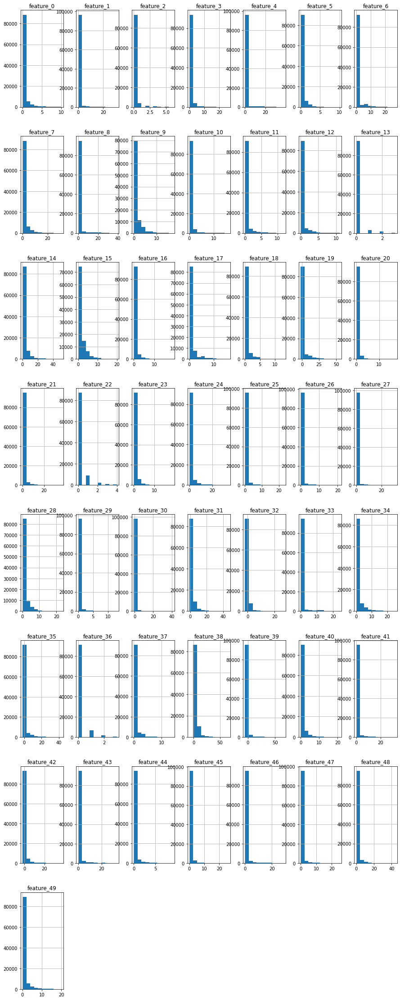

In [ ]:
train.hist(figsize=(15,40))

Из графиков можно сделать следующие выводы:
- данные дискретны, 
- данные смещены вправо (right-skewed)

Для преодоления смещения данных позже используем PowerTransformer

# Матрица корреляций

Построим тепловую карту зависимостей между признаками

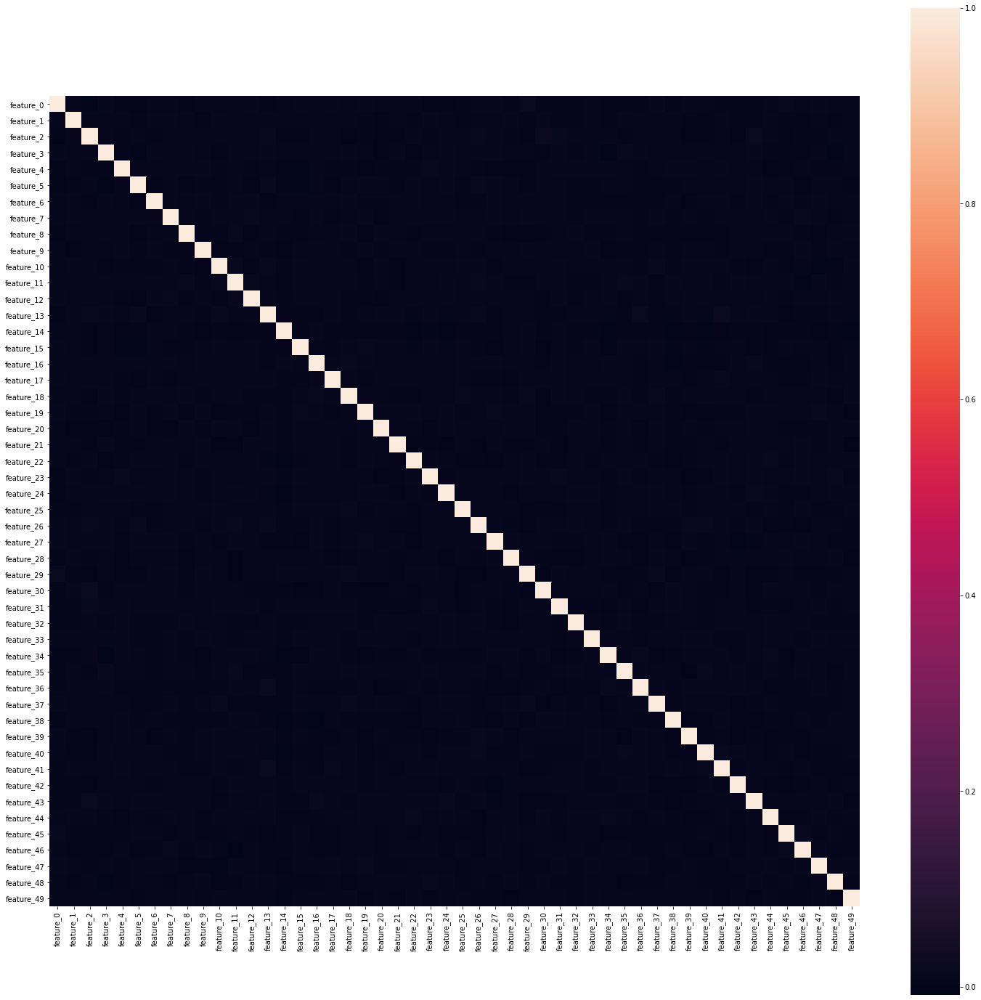

In [ ]:
plt.subplots(figsize=(25,25))
sns.heatmap(train.corr(), square=True, fmt='.2f',)
plt.show()

Из полученной матрицы можно сделать вывод о том, что между признаками нет прямой (линейной) зависимости. Однако, принимая во внимание графики гистограмм и информацию о датасете выше, можно также сделать вывод о том, что предоставленных данных недостаточно для установления линейных зависимостей (слишком много нулевых значений). 

# Общие графики признаков

Отобразим общее графическое представление данных по признакам

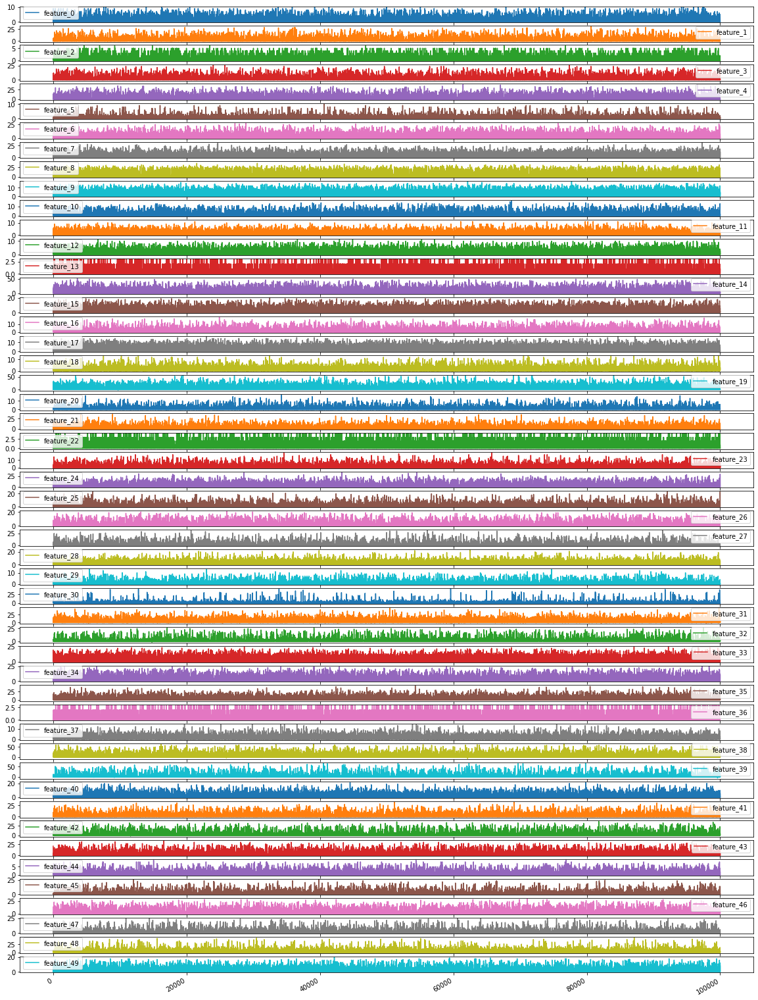

In [ ]:
train.plot(subplots=True, figsize = (20, 30))
plt.show()

Несмотря на отсутствие линейной зависимости между признаками, считаем, что связь (нелинейная) все же существует между всеми признаками, исходя из данных задачи, поэтому не будем исключать никакой признак.

Проверим, есть ли пропуски в Датасете:

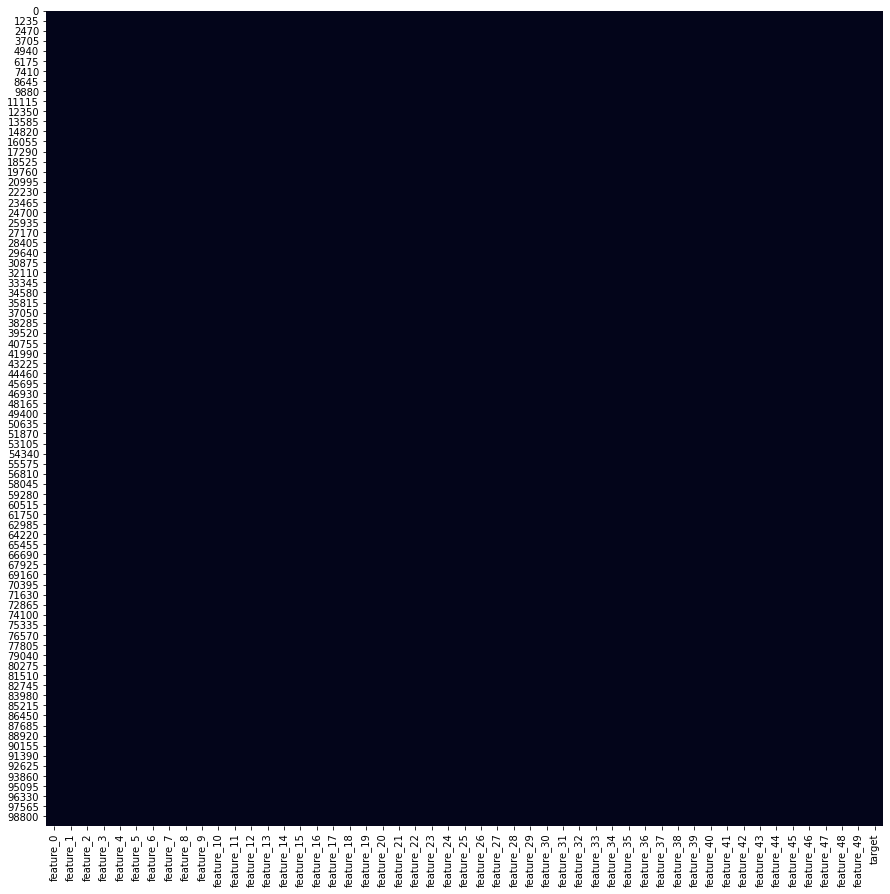

In [ ]:
figure(figsize = (15, 15))
sns.heatmap(train.isnull(), cbar=False)

Как видно из рисунка выше, пропущенные значения в Датасете отсутствуют.

Масштабирование признаков
С целью масштабирования признаков будем использовать PowerTransformer

In [6]:
pt = PowerTransformer()

Модели

In [7]:
from dask_ml.model_selection import train_test_split
X_train,X_test,y_train,y_test = train_test_split(X,y)

CatBoost

In [15]:
cat = make_pipeline(PowerTransformer(), 
                    GridSearchCV(CatBoostClassifier(), 
                                 param_grid = {'iterations': [500],
                                               'loss_function': ['MultiClass'],
                                               'logging_level':['Silent'],
                                               'random_seed': [42]},
                                 scoring='neg_log_loss',
                                 cv = 5,
                                 n_jobs = -1))

In [8]:
from dask.distributed import Client
client = Client()

In [16]:
from joblib import parallel_backend
with parallel_backend('dask'):
  cat.fit(X, y)
  pred_cat = cat.predict_proba(X_test)
print('Multi-class logarithmic loss:', metrics.log_loss(y_test, pred_cat))

Multi-class logarithmic loss: 1.0318867050610838


Логистическая регрессия

In [11]:
mdl = make_pipeline(PowerTransformer(), 
                    GridSearchCV(LogisticRegression(), 
                                 param_grid = {"penalty": ['l1', 'l2', 'elasticnet'], 
                                               'C': np.array(np.logspace(0.1, 0.9, num = 10), 
                                                             dtype='float')},
                                 scoring='neg_log_loss',
                                 cv = 5,
                                 n_jobs = -1))

In [12]:
from joblib import parallel_backend
with parallel_backend('dask'):
  mdl.fit(X, y)
  pred_mdl = mdl.predict_proba(X_test)
print('Multi-class logarithmic loss:', metrics.log_loss(y_test, pred_mdl))

Multi-class logarithmic loss: 1.0963674817601616


LGBM

In [11]:
model1 = make_pipeline(PowerTransformer(), 
                    GridSearchCV(LGBMClassifier(), 
                                 param_grid = {'n_estimators' : [500],
                                               'colsample_bytree' : [0.3],
                                               'reg_alpha' : [13],
                                               'reg_lambda' : [0.2],
                                               'objective' : ['multiclass'], 
                                               'metric' : ['multi_logloss']},
                                 scoring='neg_log_loss',
                                 cv = 5,
                                 n_jobs = -1))

In [12]:
from joblib import parallel_backend
with parallel_backend('dask'):
  model1.fit(X, y)
  pred_model1 = model1.predict_proba(X_test)
print('Multi-class logarithmic loss:', metrics.log_loss(y_test, pred_model1))

Multi-class logarithmic loss: 1.0479266614621265


Выводы

Чем меньше значение log_loss, тем лучше, соответственно, необходимо выбрать модель с минимально полученным значением (CatBoost со значением Multi-class logarithmic loss: 1.0318867050610838).

In [20]:
pred_cat = cat.predict_proba(test)
pred_cat

array([[0.07408753, 0.60688727, 0.20636638, 0.11265881],
       [0.05500717, 0.7381769 , 0.10250104, 0.10431488],
       [0.07335492, 0.66000156, 0.170086  , 0.09655752],
       ...,
       [0.08848764, 0.50694816, 0.22729026, 0.17727394],
       [0.07599439, 0.61959528, 0.150295  , 0.15411533],
       [0.10123732, 0.58803302, 0.19734198, 0.11338768]])

Результат

In [22]:
fin = pd.DataFrame(pred_cat,columns = ['Class_1','Class_2','Class_3','Class_4'])
fin = pd.concat([id,fin],axis = 1)
fin.to_csv('submission.csv',index = False)
fin.head()

,id,Class_1,Class_2,Class_3,Class_4
0,100000,0.074088,0.606887,0.206366,0.112659
1,100001,0.055007,0.738177,0.102501,0.104315
2,100002,0.073355,0.660002,0.170086,0.096558
3,100003,0.092680,0.575005,0.233815,0.098500
4,100004,0.069942,0.623012,0.198099,0.108947
